This is a YOLO model training to detect Guppy fish objects. The model used is the yolov8s model with a total of 200 training epochs. This model is trained to detect Guppy fish objects for my thesis in the form of predicting oxygen levels in aquascape water through fish positions, but it is possible that the results of this model training can also be used for other things.

The code arrangement pattern that I use for this training, I take references from the code on the following Kaggle link:

https://www.kaggle.com/code/pkdarabi/traffic-signs-detection-using-yolov8

made by Parisa Karimi Darabi, then I modified it to suit this case.

**1.Check the files in the dataset folder**

This is a code cell to check the files in the dataset, but this code cell can be left unused if you want to train the YOLO model on local computing, while for non-Kaggle cloud computing you only need to change the contents of "os.walk".

In [8]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('Guppy_fish_dataset_YOLO'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Guppy_fish_dataset_YOLO\test\images\ikan_v4_001.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_012.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_023.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_025.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_026.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_041.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_044.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_052.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_061.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_065.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_082.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_085.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_101.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_103.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_106.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_138.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_142.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_147.jpg
Guppy_fish_dataset_YOLO\test\images\ikan_v4_150.jpg
Guppy_fish_d

**2.Import Library**

code cell to import the required libraries

In [1]:
# !pip install ultralytics
# Import Essential Libraries
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

**3. Configure the plot display that the Seaborn library will create**

In [5]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

**4. Displays 9 random images in the train folder**

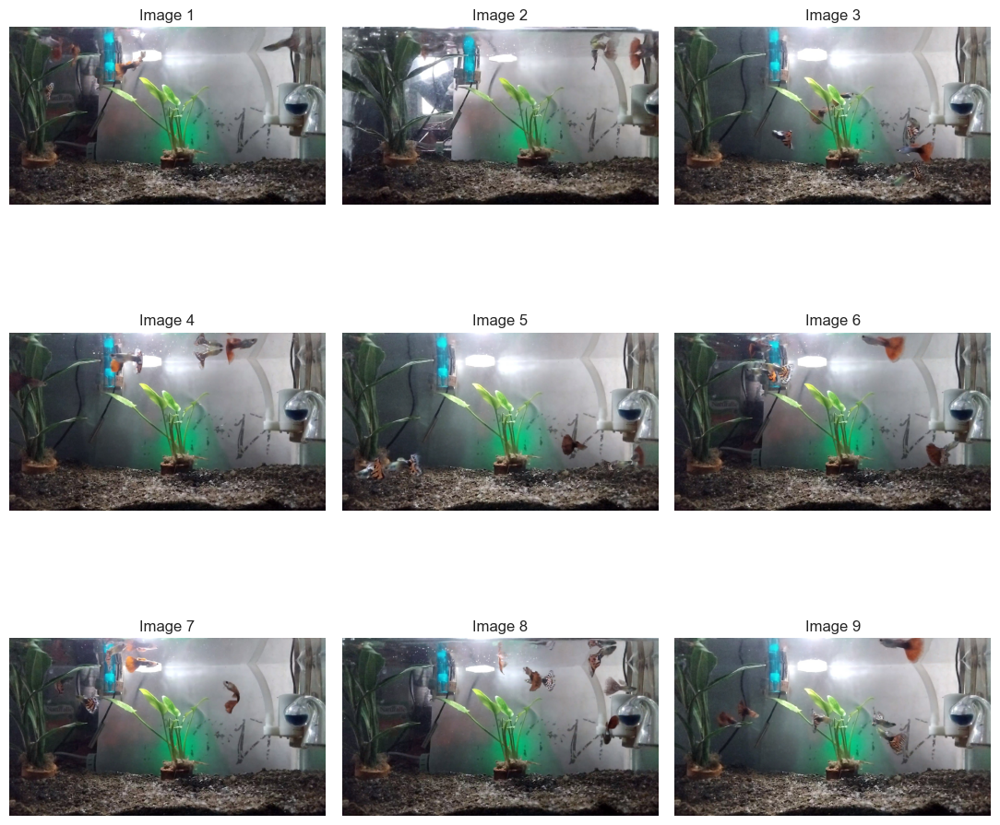

In [10]:
Image_dir = 'Guppy_fish_dataset_YOLO/train/images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

**5. Get resolution and channel information on one of the images in the train folder**

In [11]:
# Get the size of the image
image = cv2.imread("Guppy_fish_dataset_YOLO/train/images/ikan_v4_010.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 1920x1080 and 3 channels.


**6. Object detection from selected images using yolov8s default**

Object detection using YOLO version of COCO dataset

100%|██████████| 21.5M/21.5M [00:00<00:00, 47.6MB/s]



image 1/1 c:\Source\YOLO_Practice\YOLO_V8\Guppy_fish_dataset_YOLO\train\images\ikan_v4_010.jpg: 384x640 1 bird, 1 potted plant, 1 vase, 57.7ms
Speed: 4.0ms preprocess, 57.7ms inference, 81.2ms postprocess per image at shape (1, 3, 384, 640)


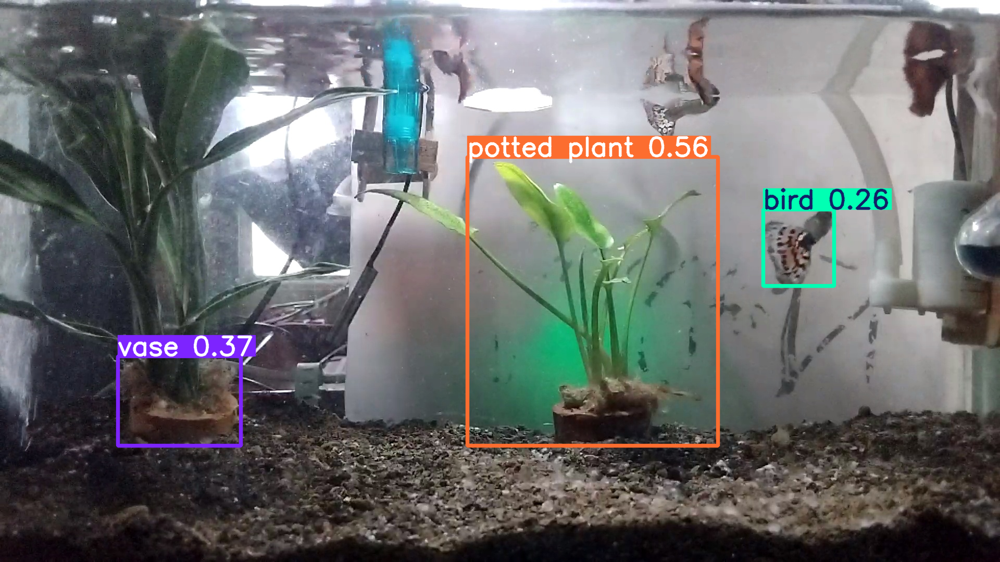

In [12]:
# Use a pretrained YOLOv8n model
model = YOLO("yolov8s.pt") 

# Use the model to detect object
image = "Guppy_fish_dataset_YOLO/train/images/ikan_v4_010.jpg"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

**7. Cell code for YOLO training using guppy-fish-dataset-yolo dataset**

The configuration of training and data augmentation used can be changed according to your wishes.

In [15]:
# Build from YAML and transfer weights
Final_model = YOLO('yolov8s.pt')

# Training The Final Model
Result_Final_model = Final_model.train(
    data="guppy_data.yaml", 
    epochs = 200, 
    imgsz = 640,
    lr0 = 0.005,
    momentum = 0.9,
    weight_decay = 0.005,
    warmup_epochs = 5,
    warmup_momentum = 0.8,
    warmup_bias_lr = 0.01,
    batch = 32,
    device = 0,

    mosaic = 1.0,
    mixup = 0.0,
    fliplr = 0.5,
    flipud = 0.3,
    degrees = 15.0,
    translate = 0.1,
    scale = 0.3,
    shear = 2.0,
    hsv_h = 0.015,
    hsv_s = 0.7,
    hsv_v = 0.4,

    cache = True,
    verbose = False,
    rect = False,
    cos_lr = True,
    profile = True
    )


Ultralytics 8.3.156  Python-3.10.11 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=guppy_data.yaml, degrees=15.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.3, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.9, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=Tr

100%|██████████| 755k/755k [00:00<00:00, 33.6MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

Model summary: 129 layers, 11,135,987 parameters, 11,135,971 gradients, 28.6 GFLOPs

Transferred 349/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 32.3MB/s]


AMP: checks passed 
train: Fast image access  (ping: 0.10.0 ms, read: 86.213.1 MB/s, size: 511.8 KB)


train: Scanning C:\Source\YOLO_Practice\YOLO_V8\Guppy_fish_dataset_YOLO\train\labels... 700 images, 4 backgrounds, 0 corrupt: 100%|██████████| 700/700 [00:01<00:00, 692.10it/s]


train: New cache created: C:\Source\YOLO_Practice\YOLO_V8\Guppy_fish_dataset_YOLO\train\labels.cache
WARNING cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.5GB RAM): 100%|██████████| 700/700 [00:01<00:00, 364.74it/s]


val: Fast image access  (ping: 0.60.2 ms, read: 25.51.9 MB/s, size: 492.9 KB)


val: Scanning C:\Source\YOLO_Practice\YOLO_V8\Guppy_fish_dataset_YOLO\valid\labels... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<00:00, 313.15it/s]


val: New cache created: C:\Source\YOLO_Practice\YOLO_V8\Guppy_fish_dataset_YOLO\valid\labels.cache
WARNING cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 150/150 [00:00<00:00, 222.19it/s]


Plotting labels to c:\Source\YOLO_Practice\runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.9' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to c:\Source\YOLO_Practice\runs\detect\train
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200       7.1G      1.884      2.351      1.549        176        640: 100%|██████████| 22/22 [00:11<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        150        601      0.762      0.613      0.657      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      6.75G      1.475      1.016      1.236        182        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]

                   all        150        601      0.777      0.709      0.817      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      7.13G      1.425     0.9084      1.217        187        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.09it/s]

                   all        150        601      0.394      0.331      0.267      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      6.94G      1.396     0.8668      1.212        202        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.229      0.285      0.143     0.0398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      6.96G      1.416     0.8813      1.226        178        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        150        601     0.0034      0.136    0.00192   0.000394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      6.82G      1.365     0.8549        1.2        188        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.39it/s]

                   all        150        601      0.796      0.689      0.792      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      6.82G      1.333     0.7981      1.177        200        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]


                   all        150        601      0.837      0.884      0.902      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      6.96G       1.32     0.8051      1.185        179        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all        150        601       0.83       0.78      0.847      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      6.91G       1.31     0.8164      1.172        197        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all        150        601       0.85      0.827      0.884      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      6.95G      1.289     0.7971      1.166        177        640: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all        150        601      0.411      0.252      0.248     0.0923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200       6.9G      1.273     0.7728      1.158        184        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.06it/s]

                   all        150        601      0.668      0.626      0.699      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      6.95G      1.228     0.7371      1.134        193        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.96it/s]

                   all        150        601      0.846      0.859      0.909      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      6.96G      1.217     0.7253      1.118        213        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all        150        601      0.899      0.861      0.943        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      6.97G      1.217     0.6949      1.129        192        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.90it/s]

                   all        150        601      0.882       0.87      0.914      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      6.95G      1.192     0.7012      1.121        172        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all        150        601      0.895      0.884       0.95      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      6.95G      1.198     0.6946      1.125        179        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.10it/s]

                   all        150        601      0.858      0.893      0.937      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      6.92G       1.19     0.6838      1.117        166        640: 100%|██████████| 22/22 [00:08<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


                   all        150        601      0.883      0.887      0.951      0.566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      6.95G      1.182     0.6915      1.118        194        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.85it/s]

                   all        150        601      0.846      0.904       0.94      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      6.91G      1.156     0.6644      1.108        206        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.896      0.874      0.938        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      6.97G       1.18     0.6708      1.107        199        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]

                   all        150        601      0.907      0.892      0.954      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      6.96G      1.181       0.67      1.115        203        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all        150        601      0.878      0.909      0.948       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      6.96G       1.15     0.6579      1.099        161        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all        150        601      0.856      0.862       0.92      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      6.96G      1.139     0.6621      1.098        183        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.96it/s]

                   all        150        601      0.893       0.82      0.926      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      6.96G       1.19     0.6706       1.12        171        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]


                   all        150        601      0.859      0.899      0.929      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      6.92G      1.161      0.661       1.11        189        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]

                   all        150        601      0.893      0.886      0.955      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      6.96G      1.118     0.6335      1.086        158        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all        150        601      0.878      0.915      0.949      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      6.89G      1.136     0.6474      1.106        205        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.00it/s]

                   all        150        601      0.865      0.927      0.956      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      6.94G      1.142     0.6412      1.095        201        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]

                   all        150        601      0.901      0.907      0.958      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      6.91G      1.102     0.6223      1.078        181        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all        150        601      0.902      0.894      0.958      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      6.95G      1.096       0.62      1.072        155        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all        150        601      0.861       0.93      0.956      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      6.91G      1.139     0.6365      1.106        172        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all        150        601      0.897      0.885      0.949      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      6.91G      1.136     0.6345      1.093        161        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.33it/s]

                   all        150        601      0.875      0.913      0.957      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      6.83G      1.095     0.6178      1.079        167        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all        150        601      0.894      0.895      0.954       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      6.95G      1.101     0.6201      1.086        189        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all        150        601      0.894      0.908      0.962      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      6.95G      1.129     0.6222      1.094        185        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all        150        601      0.853      0.948      0.952      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      6.82G      1.135     0.6323      1.098        166        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.09it/s]

                   all        150        601      0.876      0.925      0.956      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      6.96G      1.093     0.6065      1.078        186        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all        150        601      0.881      0.923      0.964      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      6.82G      1.095     0.6037      1.082        215        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all        150        601        0.9      0.928      0.968      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      6.96G       1.06     0.5772      1.064        166        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.70it/s]

                   all        150        601      0.903      0.905       0.96      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      6.94G      1.066     0.5997      1.067        191        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.32it/s]

                   all        150        601      0.923      0.895      0.963      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      6.94G      1.104     0.6133      1.083        173        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all        150        601      0.891      0.884      0.945      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200       6.9G      1.057     0.5792      1.054        213        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.06it/s]

                   all        150        601        0.9      0.885      0.955      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      6.96G      1.045     0.5728      1.057        175        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]

                   all        150        601      0.904      0.897       0.96      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      6.82G      1.064     0.5948      1.071        177        640: 100%|██████████| 22/22 [00:08<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all        150        601      0.895       0.92      0.964      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      6.95G      1.052      0.576      1.061        197        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]

                   all        150        601      0.892      0.925      0.967      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      6.96G      1.042     0.5755      1.051        201        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all        150        601      0.901       0.91      0.959      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      6.96G      1.036     0.5709      1.056        204        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all        150        601      0.877       0.93       0.96      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      6.96G      1.053     0.5752      1.066        188        640: 100%|██████████| 22/22 [00:08<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all        150        601      0.885      0.937      0.963      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      6.92G      1.071     0.5834       1.07        196        640: 100%|██████████| 22/22 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.892      0.936      0.965      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      6.96G      1.034     0.5586      1.051        166        640: 100%|██████████| 22/22 [00:08<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.03it/s]

                   all        150        601       0.91      0.927      0.964      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      6.91G      1.045     0.5668      1.054        178        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.895      0.909      0.958      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      6.97G      1.055     0.5655       1.05        214        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]

                   all        150        601      0.895      0.911      0.956      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      6.95G      1.038     0.5603       1.05        188        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.09it/s]

                   all        150        601      0.908      0.918       0.96      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      6.96G      1.006     0.5527      1.039        178        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.90it/s]

                   all        150        601      0.919      0.915       0.96      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      6.95G      1.012     0.5599      1.038        183        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]

                   all        150        601      0.892      0.897      0.946      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200       6.9G      1.022     0.5536      1.038        180        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all        150        601      0.909      0.907      0.958      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      6.95G      1.016     0.5622      1.039        163        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all        150        601      0.888      0.932      0.961      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      6.95G      1.026      0.559      1.051        207        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]

                   all        150        601      0.908      0.938      0.965      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      6.96G      1.018     0.5629      1.039        196        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all        150        601      0.889      0.923      0.961      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      6.96G      1.002     0.5446      1.033        183        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.902      0.932      0.966      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      6.95G      1.009     0.5438      1.037        184        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.916      0.927      0.968      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      6.91G     0.9873     0.5297      1.027        215        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.81it/s]

                   all        150        601      0.905      0.923      0.966      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      6.95G     0.9909     0.5357      1.025        193        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all        150        601      0.914      0.918      0.963      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      6.96G     0.9935     0.5417       1.03        201        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.10it/s]

                   all        150        601      0.912      0.915      0.961       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      6.96G      1.001     0.5413      1.035        162        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]

                   all        150        601      0.912      0.928      0.968       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      6.96G          1     0.5356      1.025        181        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.15it/s]

                   all        150        601      0.879       0.94      0.965      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      6.97G     0.9854     0.5282      1.027        189        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all        150        601      0.878      0.955      0.965      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      6.82G     0.9762     0.5314      1.019        193        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]

                   all        150        601      0.896      0.935      0.952      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      6.95G     0.9711     0.5202      1.019        173        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.80it/s]

                   all        150        601      0.902      0.933       0.96      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      6.96G     0.9694      0.522      1.017        181        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]

                   all        150        601      0.918      0.938      0.967      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      6.95G     0.9718     0.5241      1.021        182        640: 100%|██████████| 22/22 [00:08<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.79it/s]

                   all        150        601      0.902       0.92      0.968      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      6.98G     0.9767     0.5215      1.025        188        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.02it/s]

                   all        150        601      0.885      0.935      0.958       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      6.98G     0.9707     0.5213      1.015        181        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all        150        601      0.878      0.947      0.969      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      6.95G      0.986     0.5159      1.025        193        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.908      0.919      0.967      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      6.95G     0.9617     0.5119      1.013        160        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.84it/s]

                   all        150        601      0.907      0.936      0.965      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      6.96G     0.9599     0.5141      1.011        153        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]

                   all        150        601      0.915       0.91      0.966      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      6.82G     0.9699     0.5149      1.011        156        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all        150        601      0.914      0.921      0.968      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      6.82G     0.9751     0.5118      1.016        194        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all        150        601      0.901       0.93      0.967      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      6.82G     0.9343     0.4989     0.9994        186        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all        150        601      0.907      0.923      0.963      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      6.96G     0.9535     0.5079      1.009        200        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all        150        601      0.907      0.925      0.967      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      6.94G     0.9474     0.5048      1.008        155        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.86it/s]

                   all        150        601      0.906      0.932      0.965      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      6.94G     0.9401      0.506      1.006        192        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all        150        601      0.886      0.932      0.957      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200       6.9G     0.9408     0.4986      1.003        195        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.07it/s]

                   all        150        601      0.906      0.937      0.968      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      6.96G     0.9251     0.4962     0.9993        206        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]

                   all        150        601      0.909      0.943      0.971      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      6.96G     0.9296     0.4939     0.9949        200        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]

                   all        150        601      0.926      0.917      0.969      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      6.95G     0.9311     0.4981     0.9928        164        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.11it/s]

                   all        150        601      0.923      0.917      0.961       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      6.95G     0.9282     0.4925     0.9976        176        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.31it/s]

                   all        150        601      0.911      0.939      0.972      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      6.95G     0.9192     0.4941     0.9921        205        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all        150        601       0.91      0.912      0.967       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      6.96G     0.9094      0.479     0.9853        202        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all        150        601      0.916       0.92      0.965      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      6.91G     0.9117     0.4811     0.9904        180        640: 100%|██████████| 22/22 [00:08<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all        150        601      0.908      0.931      0.964       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      6.95G     0.9087      0.479     0.9872        194        640: 100%|██████████| 22/22 [00:08<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all        150        601      0.909      0.943      0.969       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200       6.9G     0.9094     0.4831     0.9914        171        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all        150        601      0.913      0.913      0.965      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      6.81G      0.926     0.4781     0.9912        195        640: 100%|██████████| 22/22 [00:08<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all        150        601       0.93      0.902      0.966      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      6.95G     0.9287     0.4903     0.9951        180        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.85it/s]

                   all        150        601      0.904      0.929      0.965      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      6.97G     0.9284     0.4783     0.9935        177        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all        150        601      0.899      0.937      0.963      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      6.95G     0.9143     0.4758     0.9862        189        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]

                   all        150        601      0.908      0.928      0.971      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      6.96G     0.9182     0.4743     0.9911        183        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all        150        601      0.928      0.923      0.966      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      6.95G     0.8966     0.4747     0.9851        185        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.909      0.928      0.965      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      6.95G     0.8844     0.4705     0.9814        171        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all        150        601      0.914       0.94      0.974      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200       6.9G     0.8919     0.4641     0.9788        153        640: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all        150        601      0.909      0.913      0.962      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      6.96G      0.896     0.4638     0.9841        189        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]

                   all        150        601      0.925       0.92      0.968       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      6.94G     0.8859     0.4599     0.9776        193        640: 100%|██████████| 22/22 [00:08<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.42it/s]

                   all        150        601      0.909      0.923      0.965      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      6.82G     0.8781     0.4623     0.9767        163        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all        150        601      0.919      0.931      0.957      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      6.96G     0.8833     0.4625     0.9804        173        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all        150        601      0.914      0.922      0.967      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      6.96G     0.8713      0.461     0.9769        180        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all        150        601      0.923      0.933      0.974      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200       6.9G     0.8733     0.4592     0.9713        194        640: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.36it/s]

                   all        150        601      0.916      0.931      0.969      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      6.64G     0.8781     0.4552     0.9782        156        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all        150        601      0.905      0.943      0.968      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      6.65G     0.8779     0.4552     0.9746        187        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all        150        601       0.91      0.922      0.967      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      6.64G      0.874     0.4471     0.9731        152        640: 100%|██████████| 22/22 [00:08<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.02it/s]

                   all        150        601      0.921      0.917      0.968       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      6.96G     0.8687     0.4508     0.9742        181        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all        150        601      0.914       0.93      0.969      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      6.81G     0.8796     0.4564     0.9762        189        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all        150        601      0.916      0.912      0.965      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      6.95G     0.8611     0.4538     0.9711        196        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all        150        601      0.925      0.937      0.975      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      6.91G     0.8638     0.4442     0.9714        220        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all        150        601      0.906      0.926      0.967      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200       6.9G     0.8528     0.4393     0.9633        181        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all        150        601      0.931      0.927       0.97      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      6.96G     0.8539     0.4357     0.9651        187        640: 100%|██████████| 22/22 [00:08<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all        150        601      0.933      0.913      0.971      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      6.95G     0.8474     0.4415     0.9628        186        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all        150        601      0.928      0.915       0.97      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      6.95G     0.8427     0.4388     0.9611        179        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]

                   all        150        601      0.898      0.934      0.961      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      6.95G     0.8334     0.4316      0.957        167        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.09it/s]

                   all        150        601      0.915      0.935      0.974      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      6.94G     0.8465     0.4375     0.9607        187        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all        150        601      0.922      0.935      0.971       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      6.94G     0.8483     0.4354     0.9602        173        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all        150        601      0.932      0.923       0.97      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      6.94G     0.8398     0.4315      0.961        182        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.38it/s]

                   all        150        601      0.925      0.925      0.965       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      6.95G     0.8348     0.4344     0.9608        168        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all        150        601      0.902      0.937      0.962      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      6.95G     0.8336     0.4252     0.9588        194        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all        150        601      0.903      0.927      0.968      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      6.91G     0.8433     0.4353     0.9622        194        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.922      0.939      0.974       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      6.82G     0.8264     0.4251     0.9558        191        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all        150        601      0.925      0.925      0.973      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      6.66G     0.8154      0.419     0.9507        194        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all        150        601      0.922      0.928      0.973      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      6.53G     0.8226     0.4208     0.9549        184        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all        150        601      0.913      0.946      0.973      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      6.66G     0.8291     0.4162     0.9564        179        640: 100%|██████████| 22/22 [00:08<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]

                   all        150        601      0.907      0.932      0.971      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      6.65G     0.8215     0.4149     0.9554        182        640: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.33it/s]

                   all        150        601      0.922      0.927      0.972      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200       6.9G     0.8187     0.4147     0.9499        202        640: 100%|██████████| 22/22 [00:08<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all        150        601      0.892      0.948      0.967      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      6.65G     0.8039     0.4095      0.947        174        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all        150        601      0.922      0.929       0.97      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      6.93G     0.8153     0.4113     0.9552        178        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all        150        601      0.914      0.934       0.97      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      6.98G     0.8145     0.4084     0.9479        164        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.15it/s]

                   all        150        601      0.921      0.926      0.968      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      6.66G     0.8086     0.4104      0.951        147        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all        150        601      0.933      0.918       0.97      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      6.95G     0.8107     0.4105     0.9533        190        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all        150        601      0.911      0.923      0.967      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      6.96G     0.7898     0.4004     0.9446        182        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all        150        601       0.93       0.91      0.967      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      6.97G     0.7886     0.4048     0.9457        183        640: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all        150        601      0.914      0.932      0.971      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      6.91G     0.7788     0.3945     0.9383        176        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.35it/s]

                   all        150        601      0.912      0.927      0.968      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      6.96G     0.7861     0.3935      0.943        179        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.09it/s]

                   all        150        601      0.921      0.934      0.968      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      6.94G     0.7841     0.4043     0.9409        193        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.05it/s]

                   all        150        601      0.929      0.915      0.966      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      6.96G     0.7759     0.3977     0.9413        170        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  3.00it/s]

                   all        150        601      0.939      0.923      0.969      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      6.96G     0.7875     0.3949     0.9443        196        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all        150        601      0.918      0.929      0.964      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      6.96G     0.7832      0.396     0.9382        201        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all        150        601       0.92      0.919      0.969      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      6.95G     0.7707       0.39     0.9359        177        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all        150        601      0.909      0.935      0.969      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      6.96G     0.7778     0.3914     0.9349        170        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.67it/s]

                   all        150        601      0.913      0.933      0.968      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      6.96G     0.7709     0.3831     0.9357        181        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.15it/s]

                   all        150        601      0.912      0.928      0.969      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      6.96G     0.7673     0.3899     0.9333        182        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]

                   all        150        601      0.913      0.933       0.97      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      6.97G     0.7624     0.3874     0.9323        173        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all        150        601      0.922      0.913      0.969      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      6.95G     0.7571     0.3791     0.9259        191        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all        150        601      0.932      0.917      0.972      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      6.83G     0.7485     0.3808     0.9248        179        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.10it/s]

                   all        150        601      0.931       0.92       0.97      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      6.95G      0.768     0.3845     0.9353        183        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.32it/s]

                   all        150        601      0.931      0.924      0.971        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      6.82G     0.7739     0.3895     0.9373        176        640: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]

                   all        150        601      0.929      0.918      0.972      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      6.96G     0.7469     0.3804     0.9257        190        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all        150        601       0.94      0.917      0.973      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      6.91G     0.7473     0.3768      0.927        176        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.15it/s]

                   all        150        601      0.918      0.932      0.973      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      6.95G     0.7541     0.3843     0.9274        184        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all        150        601      0.918      0.943      0.974      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      6.96G     0.7541     0.3786     0.9312        203        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  3.00it/s]

                   all        150        601      0.924      0.933      0.973      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      6.95G      0.753     0.3799     0.9261        209        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.14it/s]

                   all        150        601      0.912       0.94      0.972      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      6.82G     0.7487      0.375     0.9274        192        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all        150        601      0.914      0.947      0.971      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      6.96G      0.757     0.3793     0.9325        166        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all        150        601      0.917      0.937      0.969      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      6.95G     0.7432     0.3769     0.9237        197        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.86it/s]

                   all        150        601       0.92      0.923      0.969      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      6.89G     0.7487      0.377     0.9251        159        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]

                   all        150        601      0.923      0.923      0.969      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      6.81G      0.742     0.3718     0.9188        215        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.79it/s]

                   all        150        601      0.923      0.927       0.97      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      6.91G     0.7436     0.3705     0.9251        192        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all        150        601      0.937      0.917      0.969        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      6.96G     0.7157     0.3619     0.9151        204        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]

                   all        150        601      0.922      0.928      0.971        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      6.94G     0.7323     0.3662     0.9233        177        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]

                   all        150        601      0.932      0.917      0.972        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      6.95G     0.7276     0.3687     0.9218        176        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all        150        601      0.926      0.928      0.971      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      6.95G      0.714     0.3594     0.9133        140        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all        150        601      0.932       0.92      0.971      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      6.96G     0.7255     0.3632     0.9181        179        640: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.46it/s]

                   all        150        601      0.932      0.917      0.972      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      6.95G     0.7343     0.3738     0.9191        191        640: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.11it/s]

                   all        150        601      0.932      0.923      0.972      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      6.82G     0.7358     0.3652     0.9239        193        640: 100%|██████████| 22/22 [00:08<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all        150        601      0.922      0.933      0.972      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200       6.9G     0.7282     0.3659     0.9234        187        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all        150        601      0.932       0.92       0.97      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      6.95G     0.7257      0.363     0.9162        172        640: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.40it/s]

                   all        150        601      0.926      0.923      0.968      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      6.96G     0.7119      0.356     0.9147        200        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all        150        601      0.926      0.922      0.968      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      6.94G     0.7157     0.3624     0.9171        184        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.37it/s]

                   all        150        601      0.931      0.922       0.97      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200       6.9G     0.7186     0.3636      0.915        196        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all        150        601      0.936      0.919      0.971      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200       6.9G     0.7264     0.3651     0.9191        163        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.934      0.917       0.97      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      6.95G     0.7265      0.365     0.9192        172        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]

                   all        150        601      0.931      0.917      0.971      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      6.82G      0.718     0.3643     0.9201        164        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all        150        601      0.928       0.92      0.969      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      6.91G     0.7199       0.36     0.9181        194        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]

                   all        150        601      0.926      0.918       0.97      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      6.95G     0.7071     0.3541     0.9125        171        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all        150        601      0.896      0.951       0.97      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      6.95G     0.7158     0.3576     0.9187        178        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.33it/s]

                   all        150        601      0.903       0.95      0.971      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      6.95G     0.7095     0.3566     0.9139        169        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all        150        601      0.901       0.95       0.97      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      6.95G     0.7214     0.3607     0.9182        173        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.42it/s]

                   all        150        601        0.9      0.948       0.97      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      6.81G     0.7054     0.3566     0.9099        200        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.11it/s]

                   all        150        601      0.903      0.942      0.971      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      6.94G     0.7073     0.3522     0.9117        159        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.35it/s]

                   all        150        601        0.9      0.947       0.97      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      6.94G     0.7123     0.3578     0.9167        181        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all        150        601      0.934      0.915       0.97      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      6.95G       0.72      0.361     0.9162        178        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.05it/s]

                   all        150        601      0.934      0.915      0.971      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      6.95G      0.706     0.3555      0.912        176        640: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all        150        601      0.931      0.914       0.97      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      6.81G     0.7065     0.3554     0.9145        186        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]

                   all        150        601      0.931      0.919       0.97      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      6.95G      0.711      0.359     0.9151        179        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all        150        601      0.931       0.92       0.97      0.705


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      6.87G     0.6944     0.3356     0.8962         89        640: 100%|██████████| 22/22 [00:09<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all        150        601      0.908      0.938      0.967      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      6.87G     0.6889     0.3218     0.8919        112        640: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all        150        601      0.906      0.937      0.965      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      6.87G      0.676     0.3197     0.8847        100        640: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all        150        601      0.906      0.932      0.962      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      6.87G     0.6786     0.3155     0.8889        108        640: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.90it/s]

                   all        150        601      0.904       0.94      0.964      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      6.87G     0.6718     0.3132     0.8861        113        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.11it/s]

                   all        150        601      0.904      0.943      0.966      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      6.87G     0.6701     0.3112      0.888        101        640: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all        150        601      0.937      0.914      0.967      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      6.87G     0.6724     0.3073     0.8909        107        640: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.36it/s]

                   all        150        601      0.934      0.915      0.967      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      6.87G     0.6559      0.306     0.8825         99        640: 100%|██████████| 22/22 [00:08<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]

                   all        150        601      0.932      0.917      0.967      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      6.87G     0.6694     0.3099     0.8847        115        640: 100%|██████████| 22/22 [00:08<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all        150        601      0.939      0.915      0.965      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      6.87G     0.6507     0.3081     0.8797        107        640: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.05it/s]

                   all        150        601      0.939      0.915      0.965      0.689



200 epochs completed in 0.571 hours.
Optimizer stripped from c:\Source\YOLO_Practice\runs\detect\train\weights\last.pt, 22.5MB
Optimizer stripped from c:\Source\YOLO_Practice\runs\detect\train\weights\best.pt, 22.5MB

Validating c:\Source\YOLO_Practice\runs\detect\train\weights\best.pt...
Ultralytics 8.3.156  Python-3.10.11 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]


                   all        150        601      0.932      0.917      0.972      0.708
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to c:\Source\YOLO_Practice\runs\detect\train


**8. Displays training results.**

The training results in question are in the form of confusion matrix, F1-score graph, Precision, Recall, and others that are needed for analysis.

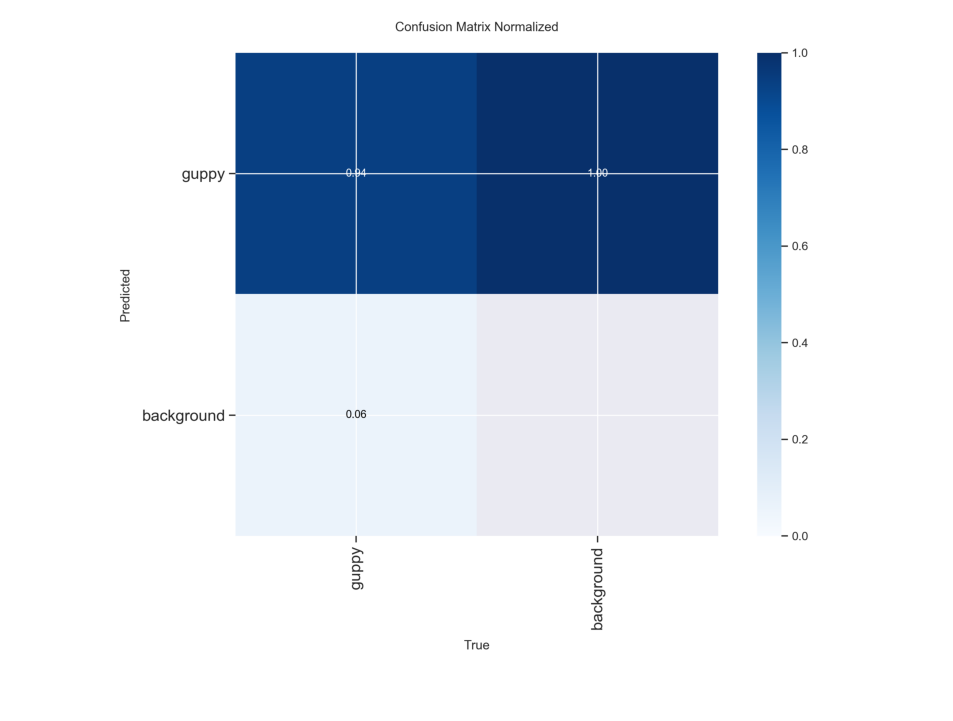

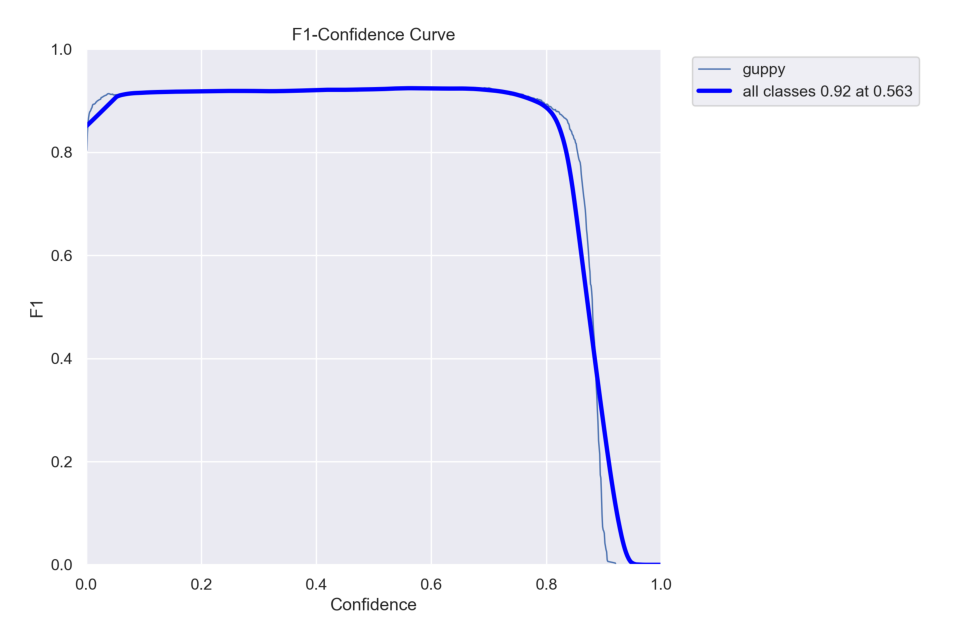

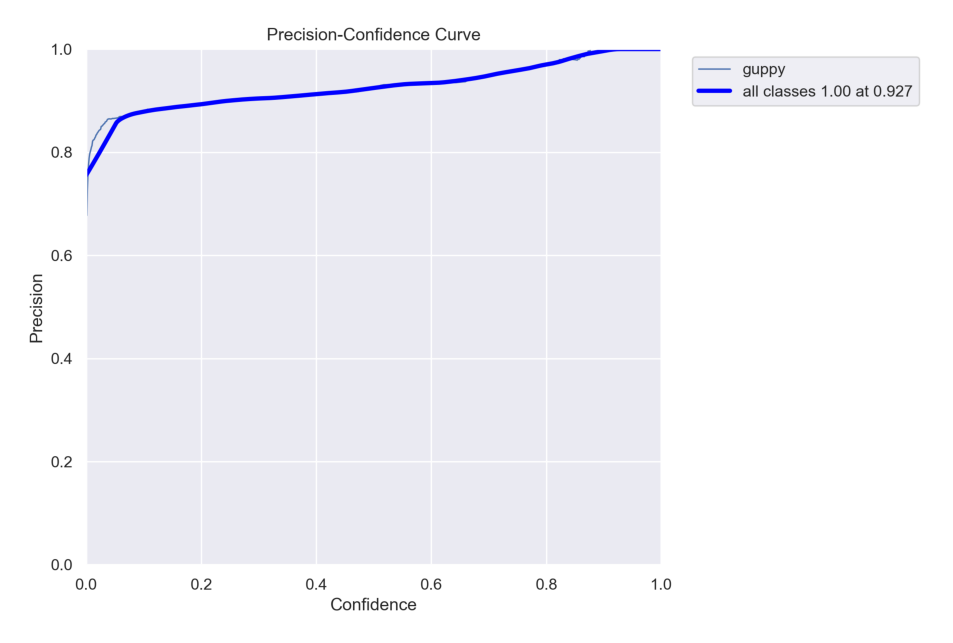

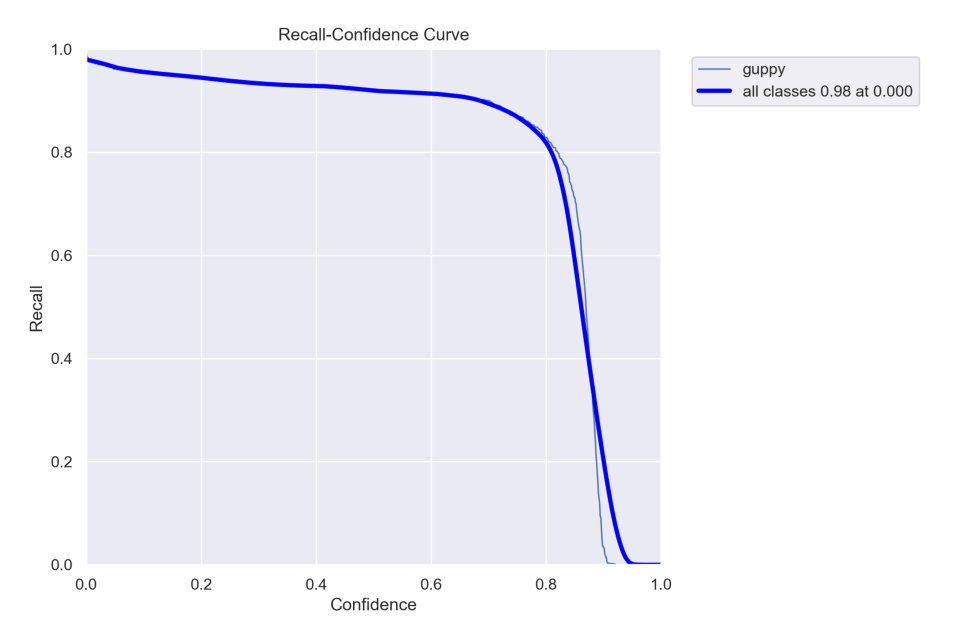

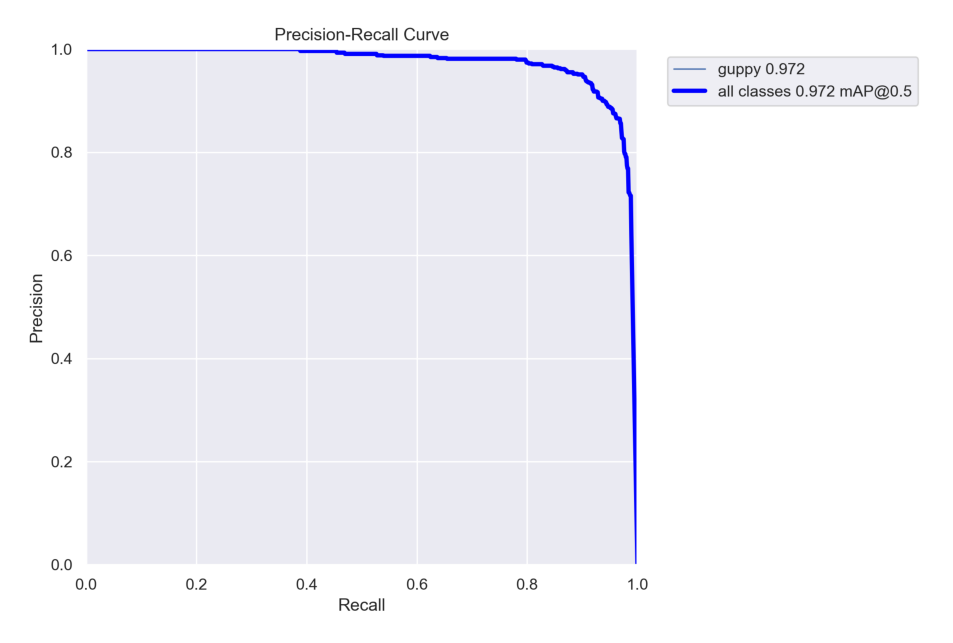

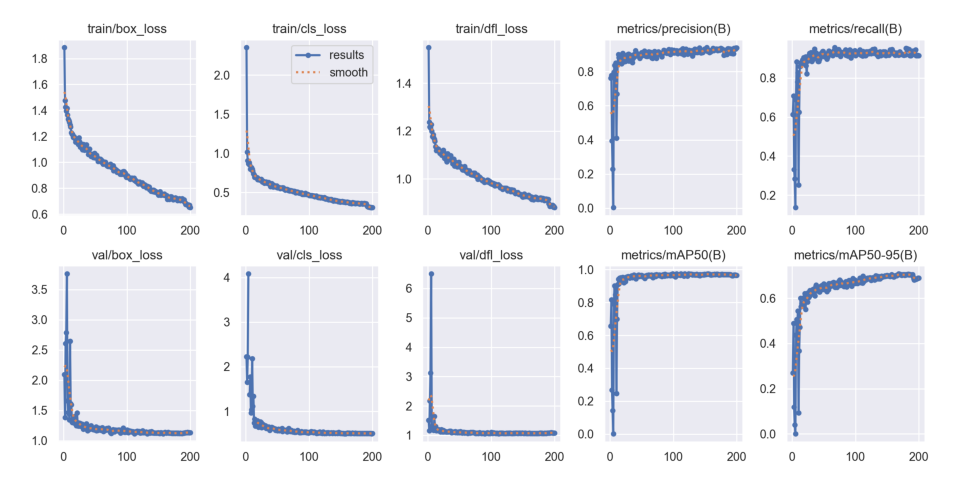

In [20]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '../runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)


**9. Display training results in csv format**

In [21]:
Result_Final_model = pd.read_csv('../runs/detect/train/results.csv')
Result_Final_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
190,191,1962.93,0.69444,0.33561,0.89624,0.90782,0.93844,0.96715,0.69636,1.12852,0.50391,1.07892,0.000032,0.000032,0.000032
191,192,1973.23,0.68893,0.32179,0.89191,0.90621,0.93677,0.96466,0.68690,1.13232,0.50597,1.08298,0.000030,0.000030,0.000030
192,193,1983.30,0.67603,0.31970,0.88471,0.90629,0.93178,0.96231,0.68158,1.13513,0.50640,1.08467,0.000028,0.000028,0.000028
193,194,1993.43,0.67859,0.31548,0.88889,0.90395,0.93951,0.96376,0.68208,1.13641,0.50906,1.08557,0.000026,0.000026,0.000026
194,195,2003.56,0.67179,0.31324,0.88611,0.90419,0.94343,0.96564,0.68407,1.13630,0.50680,1.08583,0.000024,0.000024,0.000024
195,196,2013.63,0.67013,0.31123,0.88797,0.93692,0.91440,0.96686,0.68434,1.13722,0.50558,1.08606,0.000023,0.000023,0.000023
196,197,2023.66,0.67236,0.30732,0.89093,0.93398,0.91514,0.96715,0.68697,1.13483,0.50610,1.08437,0.000022,0.000022,0.000022
197,198,2033.60,0.65586,0.30603,0.88254,0.93235,0.91731,0.96745,0.68770,1.13381,0.50575,1.08291,0.000021,0.000021,0.000021
198,199,2043.51,0.66939,0.30992,0.88475,0.93854,0.91479,0.96484,0.68914,1.13262,0.50228,1.08165,0.000020,0.000020,0.000020
199,200,2053.61,0.65072,0.30814,0.87969,0.93940,0.91514,0.96529,0.68903,1.13404,0.50337,1.08185,0.000020,0.000020,0.000020


**10. Creating a graph from data in a csv file**

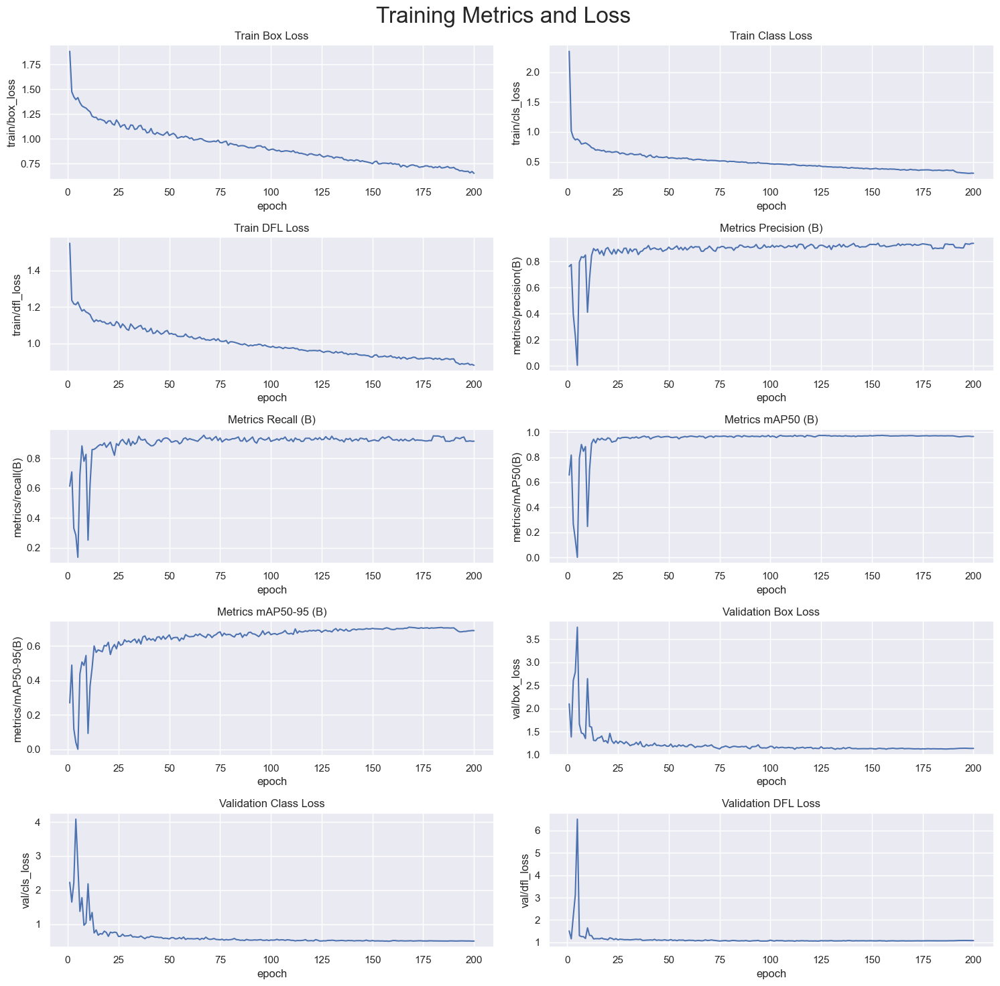

In [22]:
# Read the results.csv file as a pandas dataframe
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

**11. Performing model performance validation**

In [23]:
# Loading the best performing model
Valid_model = YOLO('../runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.156  Python-3.10.11 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 740.982.0 MB/s, size: 493.2 KB)


val: Scanning C:\Source\YOLO_Practice\YOLO_V8\Guppy_fish_dataset_YOLO\valid\labels.cache... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.04it/s]


                   all        150        601      0.932      0.917      0.972      0.707
Speed: 0.5ms preprocess, 4.9ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to c:\Source\YOLO_Practice\runs\detect\val
precision(B):  0.9318989107544849
metrics/recall(B):  0.9168053244592346
metrics/mAP50(B):  0.9721559175351526
metrics/mAP50-95(B):  0.707282411090075


**12. Detecting guppy fish in 9 random images on the dataset using the trained YOLO model.**


0: 640x640 2 guppys, 154.1ms
Speed: 3.8ms preprocess, 154.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 guppys, 107.8ms
Speed: 3.4ms preprocess, 107.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 guppy, 7.7ms
Speed: 1.5ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 guppys, 7.8ms
Speed: 1.5ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 guppys, 7.5ms
Speed: 1.8ms preprocess, 7.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 7 guppys, 9.6ms
Speed: 1.6ms preprocess, 9.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 guppy, 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 6 guppys, 7.8ms
Speed: 1.6ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0

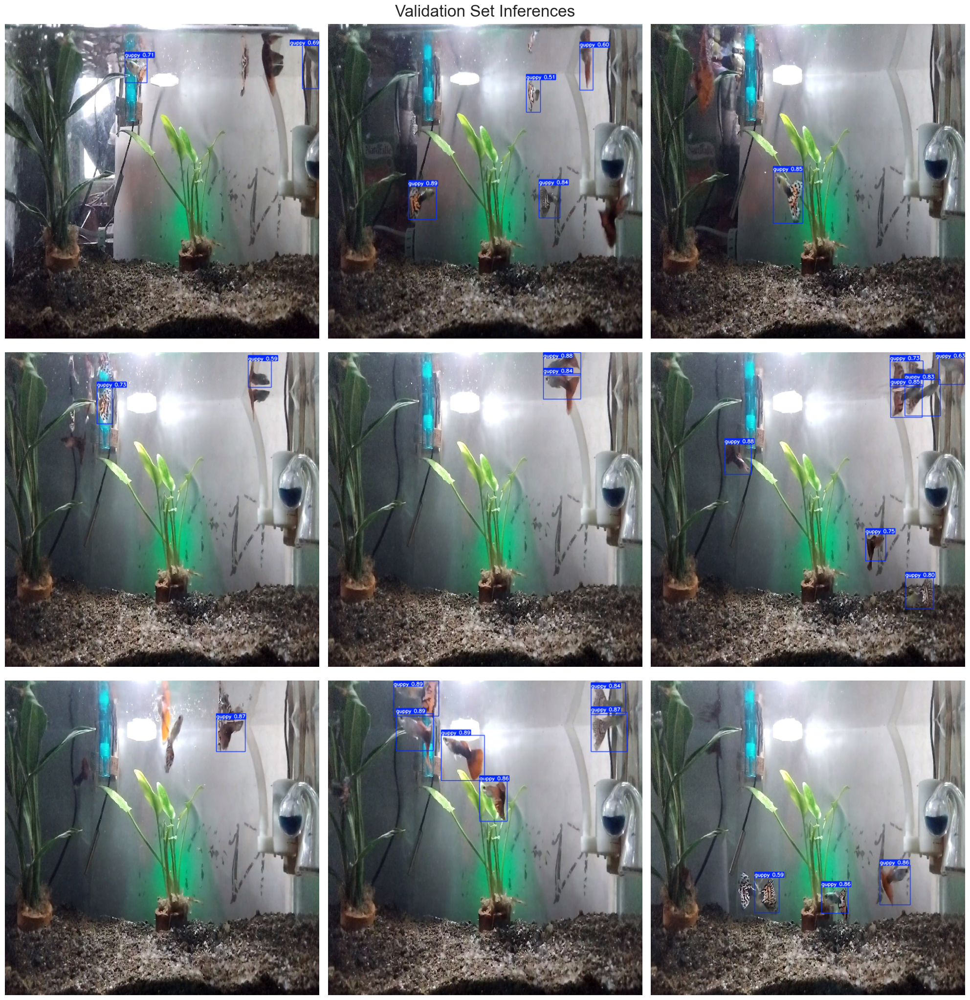

In [26]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = 'Guppy_fish_dataset_YOLO'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
# 영상 및 모델 경로
video_path = '../YOLO_V8/video_aquascape_2.mp4'
model = YOLO('../runs/detect/train/weights/best.pt')

# 비디오 캡처 열기
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

# 🔧 첫 프레임을 읽어 회전하고, 정확한 크기 측정
ret, frame = cap.read()
if not ret:
    raise RuntimeError("영상을 읽을 수 없습니다.")

# 프레임 회전 (반시계 90도)
frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
height, width = frame.shape[:2]

# VideoWriter 초기화 (회전된 프레임 크기 사용)
out = cv2.VideoWriter('output_detected.mp4',
                      cv2.VideoWriter_fourcc(*'mp4v'),
                      fps, (width, height))

# 🔁 첫 프레임 처리
results = model.predict(source=frame, conf=0.5, verbose=False)
annotated_frame = results[0].plot()
out.write(annotated_frame)
cv2.imshow("Detected", annotated_frame)
cv2.waitKey(1)

# 🔁 나머지 프레임 반복 처리
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
    results = model.predict(source=frame, conf=0.5, verbose=False)
    annotated_frame = results[0].plot()
    out.write(annotated_frame)

    cv2.imshow("Detected", annotated_frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()


In [5]:
import cv2
import torch
import argparse
import numpy as np
if not hasattr(np, 'float'):
    np.float = float
from ultralytics import YOLO
from yolox.tracker.byte_tracker import BYTETracker

# 🔍 모델 및 영상 경로
video_path = '../YOLO_V8/video_aquascape_2.mp4'
model = YOLO('../runs/detect/train/weights/best.pt')

# 🔧 ByteTrack 설정
tracker_args = {
    'track_thresh': 0.5,
    'match_thresh': 0.8,
    'track_buffer': 30,
    'frame_rate': 30,
    'min_box_area': 100,
    'iou_thresh': 0.5,
    'mot20': False
}
tracker_args = argparse.Namespace(**tracker_args)

tracker = BYTETracker(tracker_args, frame_rate=tracker_args.frame_rate)

# 🎥 비디오 열기
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

# ▶ 첫 프레임 읽기 및 회전
ret, frame = cap.read()
if not ret:
    raise RuntimeError("영상을 읽을 수 없습니다.")
frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
height, width = frame.shape[:2]

# 📼 저장용 VideoWriter 설정
out = cv2.VideoWriter('output_tracked.mp4',
                      cv2.VideoWriter_fourcc(*'mp4v'),
                      fps, (width, height))

# ▶▶ 첫 프레임 처리
results = model.predict(source=frame, conf=0.5, verbose=False)[0]
detections = []

for det in results.boxes:
    cls_id = int(det.cls)
    if cls_id != 0:  # '물고기' 클래스만 추적
        continue
    x1, y1, x2, y2 = map(int, det.xyxy[0])
    conf = float(det.conf[0])
    detections.append([x1, y1, x2 - x1, y2 - y1, conf])

dets_tensor = torch.tensor(detections) if detections else torch.empty((0, 5))
online_targets = tracker.update(dets_tensor, frame.shape[:2], frame.shape[:2])

# 🔍 시각화 (ID 포함)
for track in online_targets:
    x, y, w, h = map(int, track.tlwh)
    tid = track.track_id
    cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(frame, f'ID: {tid}', (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

out.write(frame)
cv2.imshow("Tracked", frame)
cv2.waitKey(1)

# 🔁 이후 프레임 반복
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
    results = model.predict(source=frame, conf=0.5, verbose=False)[0]

    detections = []
    for det in results.boxes:
        cls_id = int(det.cls)
        if cls_id != 0:
            continue
        x1, y1, x2, y2 = map(int, det.xyxy[0])
        conf = float(det.conf[0])
        detections.append([x1, y1, x2 - x1, y2 - y1, conf])

    dets_tensor = torch.tensor(detections) if detections else torch.empty((0, 5))
    online_targets = tracker.update(dets_tensor, frame.shape[:2], frame.shape[:2])

    for track in online_targets:
        x, y, w, h = map(int, track.tlwh)
        tid = track.track_id
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(frame, f'ID: {tid}', (x, y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    out.write(frame)
    cv2.imshow("Tracked", frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# 자원 정리
cap.release()
out.release()
cv2.destroyAllWindows()
